In [1]:
%load_ext autoreload
%autoreload 2

# Link Analysis
Conducting a link analysis of a network graph involves identifying and analyzing the link within the graph. 

In [2]:
import pandas as pd
import numpy as np
from os.path import join
import os


from dotenv import load_dotenv
load_dotenv()  

path = os.environ['DATA_DIRECTORY']
df_snapshots = pd.read_csv('../data/snapshot_selection.csv')
df_tokens = pd.read_csv("../data/final_token_selection.csv")


In [3]:
import sys
sys.path.append('..') 

from src.analysis.link_analysis import * 
from src.visualisations.link_analysis_visualisations_v3 import * 

## Create dataframes for each metrics

In [4]:
# Specify the path to the file containing the saved cliques data
# links_data_path = join(path, '../output/links/metrics/links_data_5e-06.pkl') # load reference value
links_data_path = join(path, '../output/links/metrics/links_data.pkl') # load reference value

links_data = LinkData(links_data_path)


# Use the metric_names attribute from CliquesData
metric_names = links_data.metric_names


# Initialize an empty dictionary to store DataFrames for each metric
metric_dataframes = {'sample': {},'sample_population': {},'pvalues': {}, 'sample_directional':{}, 'sample_population_directional':{}, 'pvalues_directional':{}}

# Create DataFrames for each metric
for group in ['sample', 'sample_population', 'pvalues', 'sample_directional', 'sample_population_directional', 'pvalues_directional']:
    for metric_name in metric_names:
        metric_dataframes[group][metric_name] = links_data.get_metric_data(group, metric_name)
        

## Figure Generation

### Fig: Size of Clique 

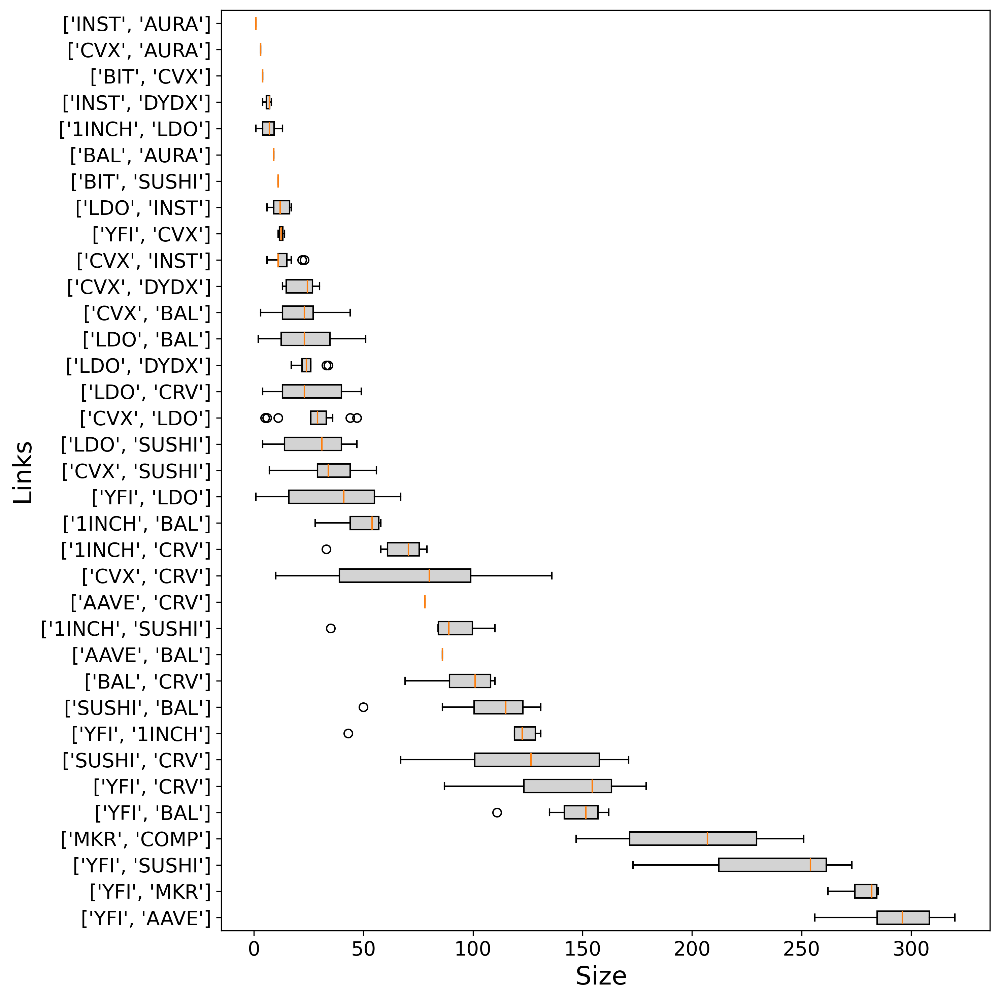

In [11]:
plot_boxplot(metric_dataframes, metric='size', unit='', group='sample', output_path="../output/links/", min_occurrences=1, save=True, show=True)


### Fig: link growth over time 

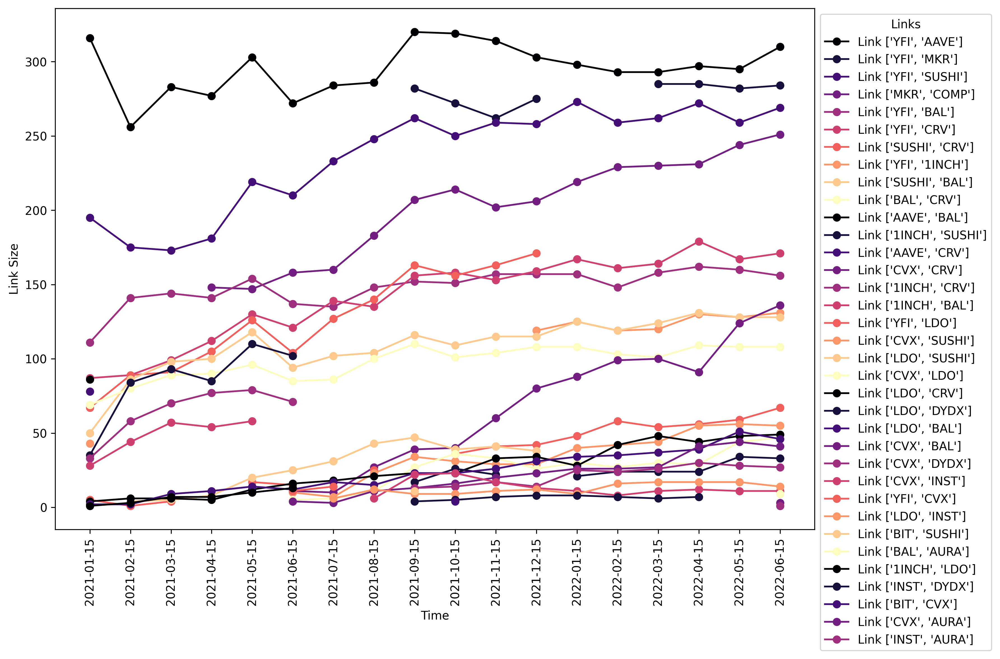

In [24]:
plot_link_growth_over_time(metric_dataframes, group='sample', output_path="../output/links/", save=True, show=True)

### Fig: Scatter  

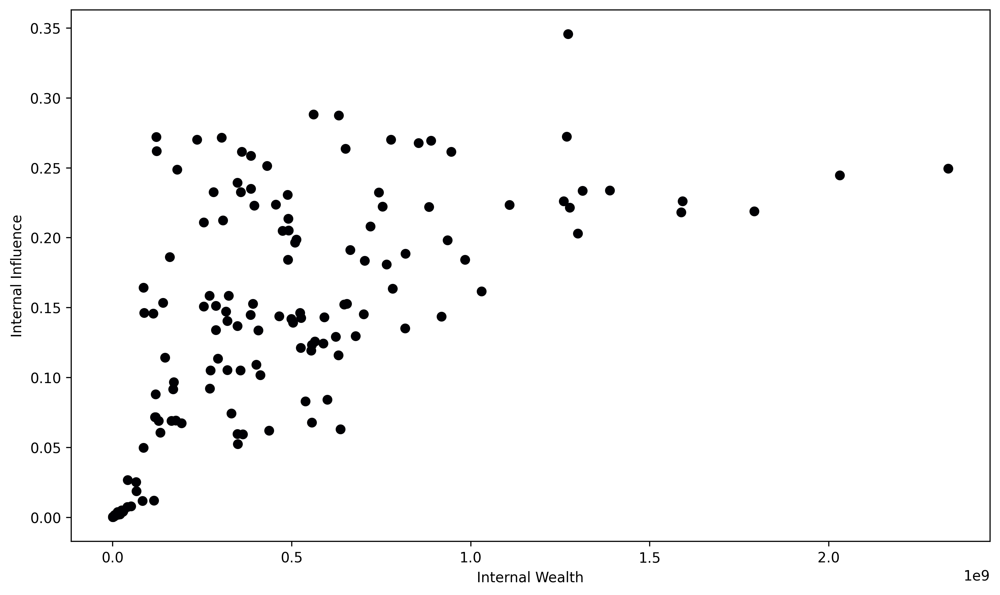

In [25]:
plot_scatter_metrics(metric_dataframes, 'internal_wealth', 'internal_influence', save=False)


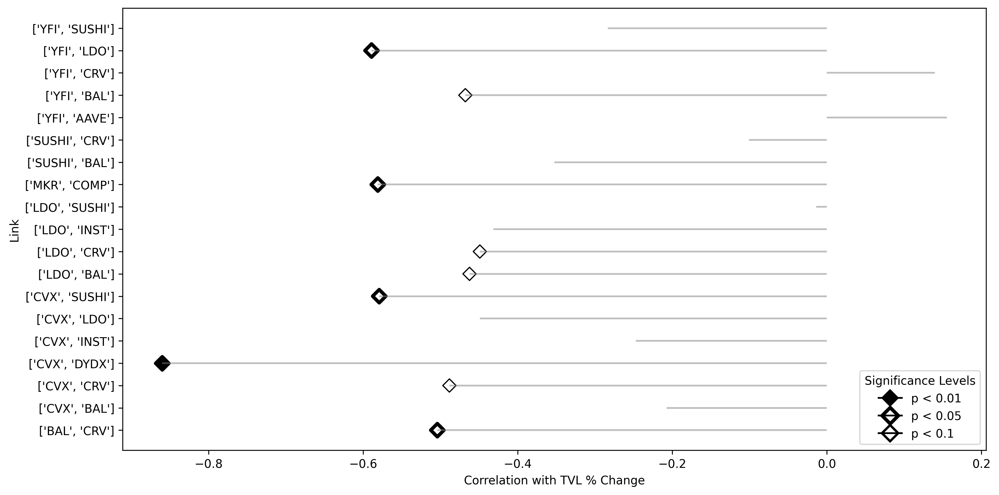

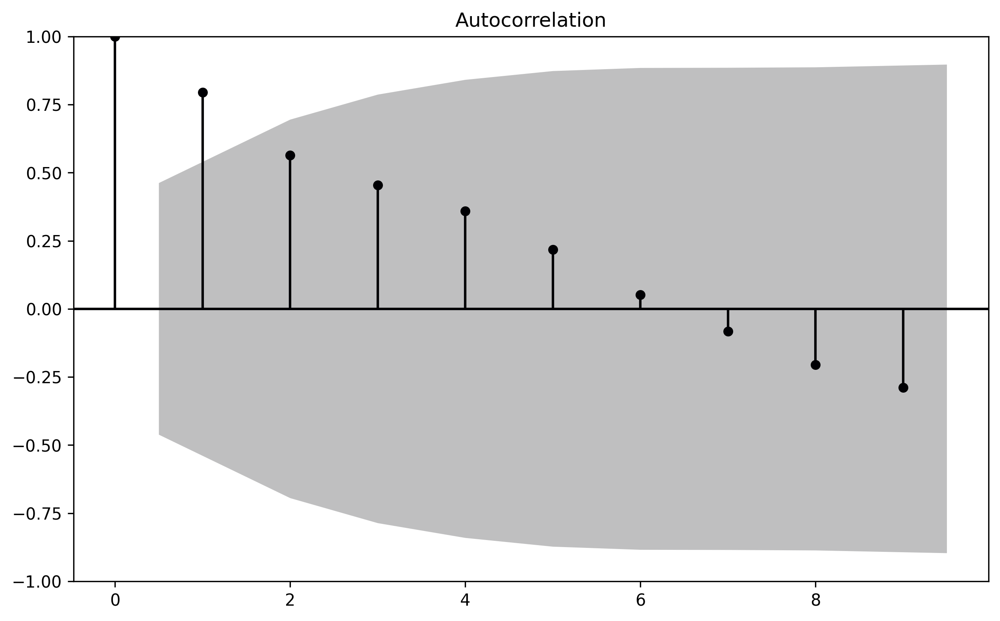


===== Summary Statistics =====
                  Correlation   P-value  Durbin-Watson  Ljung-Box P-value
Link Name                                                                
['BAL', 'CRV']      -0.504112  0.032908       0.014182       1.866268e-04
['CVX', 'BAL']      -0.207235  0.496921       0.103937       2.597658e-01
['CVX', 'CRV']      -0.488491  0.090307       0.026756       3.286658e-03
['CVX', 'DYDX']     -0.860444  0.001397       0.045096       8.751511e-05
['CVX', 'INST']     -0.247358  0.463364       0.027130       8.782711e-03
['CVX', 'LDO']      -0.448900  0.123875       0.212138       6.444723e-01
['CVX', 'SUSHI']    -0.579309  0.038003       0.053266       7.217754e-05
['LDO', 'BAL']      -0.462480  0.053299       0.122363       9.584145e-04
['LDO', 'CRV']      -0.449120  0.061525       0.267914       3.217580e-01
['LDO', 'INST']     -0.431587  0.161233       0.307389       2.081927e-01
['LDO', 'SUSHI']    -0.013858  0.967743       0.090951       3.885862e-04
['MKR'

,Correlation,P-value,Durbin-Watson,Ljung-Box P-value
Link Name,,,,
"['BAL', 'CRV']",-0.504112,0.032908,0.014182,1.866268e-04
"['CVX', 'BAL']",-0.207235,0.496921,0.103937,2.597658e-01
"['CVX', 'CRV']",-0.488491,0.090307,0.026756,3.286658e-03
"['CVX', 'DYDX']",-0.860444,0.001397,0.045096,8.751511e-05
"['CVX', 'INST']",-0.247358,0.463364,0.027130,8.782711e-03
"['CVX', 'LDO']",-0.448900,0.123875,0.212138,6.444723e-01
"['CVX', 'SUSHI']",-0.579309,0.038003,0.053266,7.217754e-05
"['LDO', 'BAL']",-0.462480,0.053299,0.122363,9.584145e-04
"['LDO', 'CRV']",-0.449120,0.061525,0.267914,3.217580e-01


In [26]:
plot_lollipop_correlation_vs_tvl_r(metric_dataframes, metric='internal_influence', min_occurrences=9, output_path='../output/links', tvl_data_path='../data/tvl.json', save=False, show=True)


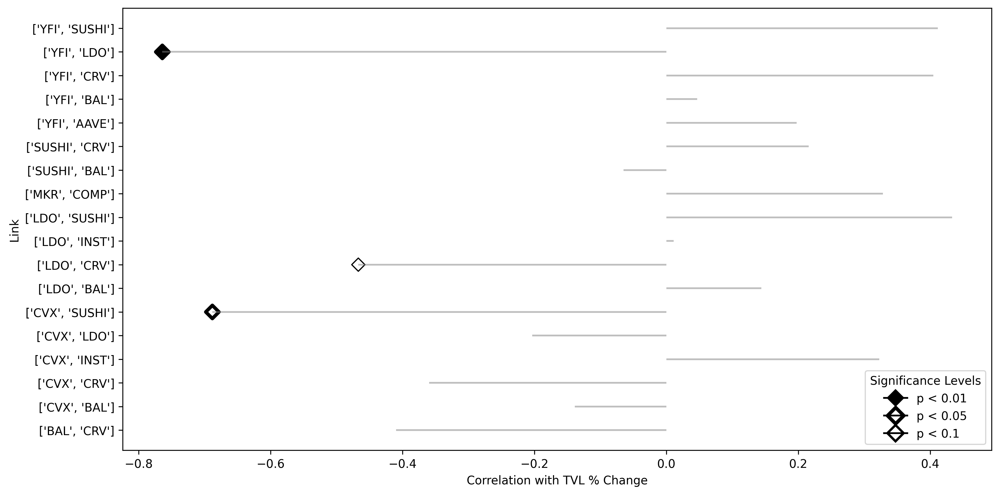

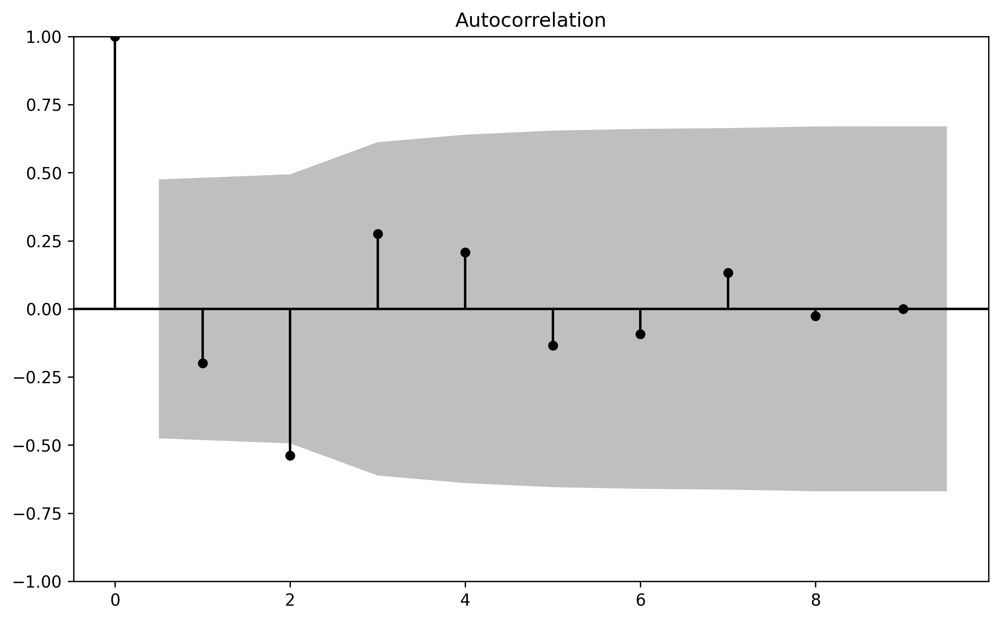


===== Summary Statistics =====
                  Correlation   P-value  Durbin-Watson  Ljung-Box P-value
Link Name                                                                
['BAL', 'CRV']      -0.409517  0.102597       0.738813           0.804060
['CVX', 'BAL']      -0.138663  0.667357       2.185742           0.247922
['CVX', 'CRV']      -0.359588  0.250953       1.297216           0.562715
['CVX', 'INST']      0.322698  0.363127       2.397829           0.561616
['CVX', 'LDO']      -0.203296  0.526266       0.880277           0.670018
['CVX', 'SUSHI']    -0.688164  0.013359       1.018013           0.562746
['LDO', 'BAL']       0.144305  0.580557       2.699140           0.280214
['LDO', 'CRV']      -0.466895  0.058832       1.353841           0.547762
['LDO', 'INST']      0.011288  0.973723       2.089917           0.981410
['LDO', 'SUSHI']     0.433308  0.210953       1.033480           0.626527
['MKR', 'COMP']      0.328573  0.251385       2.195846           0.449375
['SUSH

,Correlation,P-value,Durbin-Watson,Ljung-Box P-value
Link Name,,,,
"['BAL', 'CRV']",-0.409517,0.102597,0.738813,0.804060
"['CVX', 'BAL']",-0.138663,0.667357,2.185742,0.247922
"['CVX', 'CRV']",-0.359588,0.250953,1.297216,0.562715
"['CVX', 'INST']",0.322698,0.363127,2.397829,0.561616
"['CVX', 'LDO']",-0.203296,0.526266,0.880277,0.670018
"['CVX', 'SUSHI']",-0.688164,0.013359,1.018013,0.562746
"['LDO', 'BAL']",0.144305,0.580557,2.699140,0.280214
"['LDO', 'CRV']",-0.466895,0.058832,1.353841,0.547762
"['LDO', 'INST']",0.011288,0.973723,2.089917,0.981410


In [27]:
plot_lollipop_correlation_vs_tvl_adjusted_auto_corr(metric_dataframes, metric='internal_influence', min_occurrences=9, output_path='../output/links', tvl_data_path='../data/tvl.json', save=True, show=True)

### Fig: total_influence

In [21]:
# Example call to the function
# plot_monthly_tvl(metric_dataframes, tvl_data_path='../data/tvl.json', save=True, show=True)

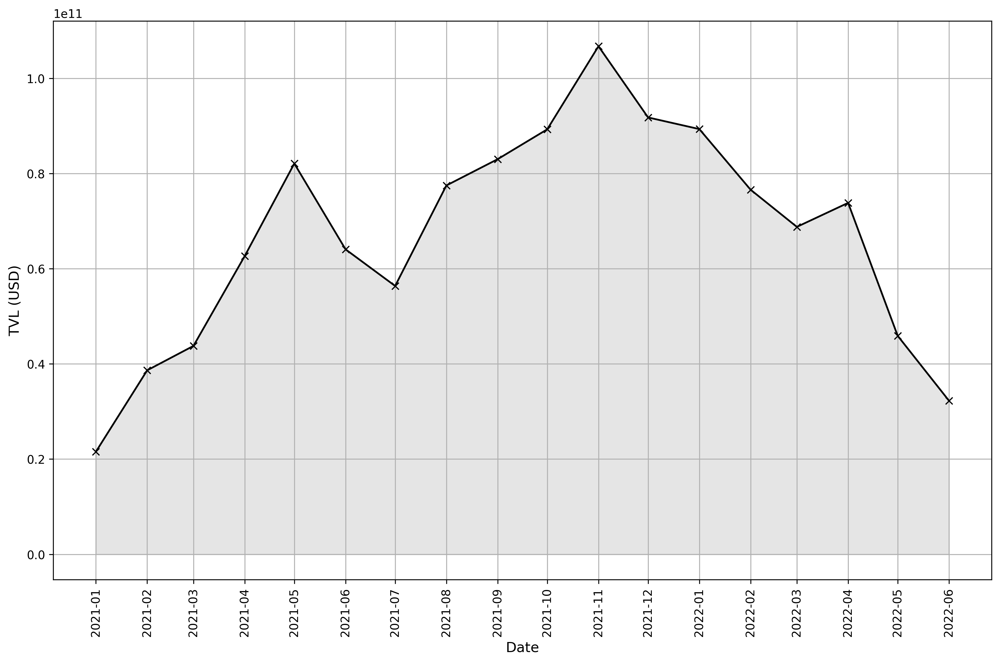

In [28]:
# Example call to the function
plot_monthly_tvl(metric_dataframes, tvl_data_path='../data/tvl.json', save=True, show=True)


/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations_v3.py:280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.tick_params(labelsize=FONT_SIZE_TEXT)  # Increased tick label size


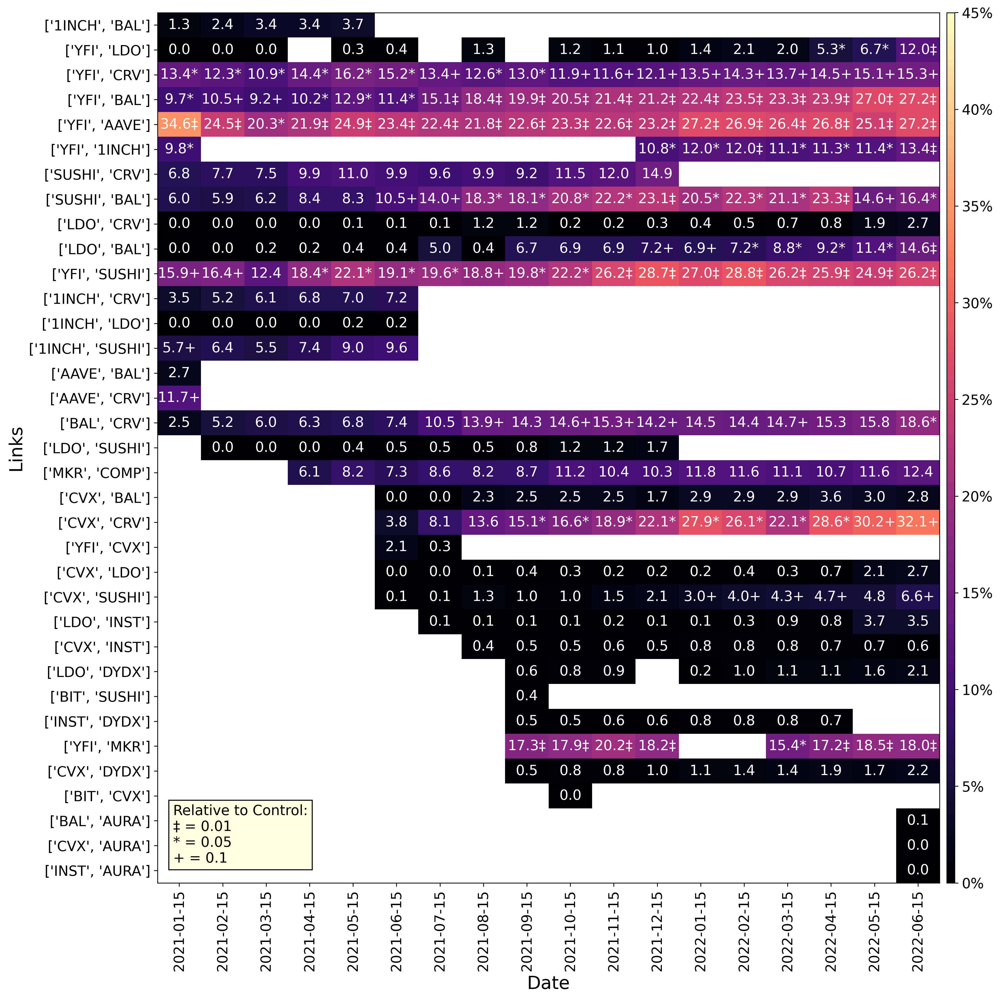

In [41]:
plot_heatmap_chart(metric_dataframes, metric_name='internal_influence', pct=True,  log=False, output_path="../output/links/", save=True, show=True)

### Fig: gini_total_influence

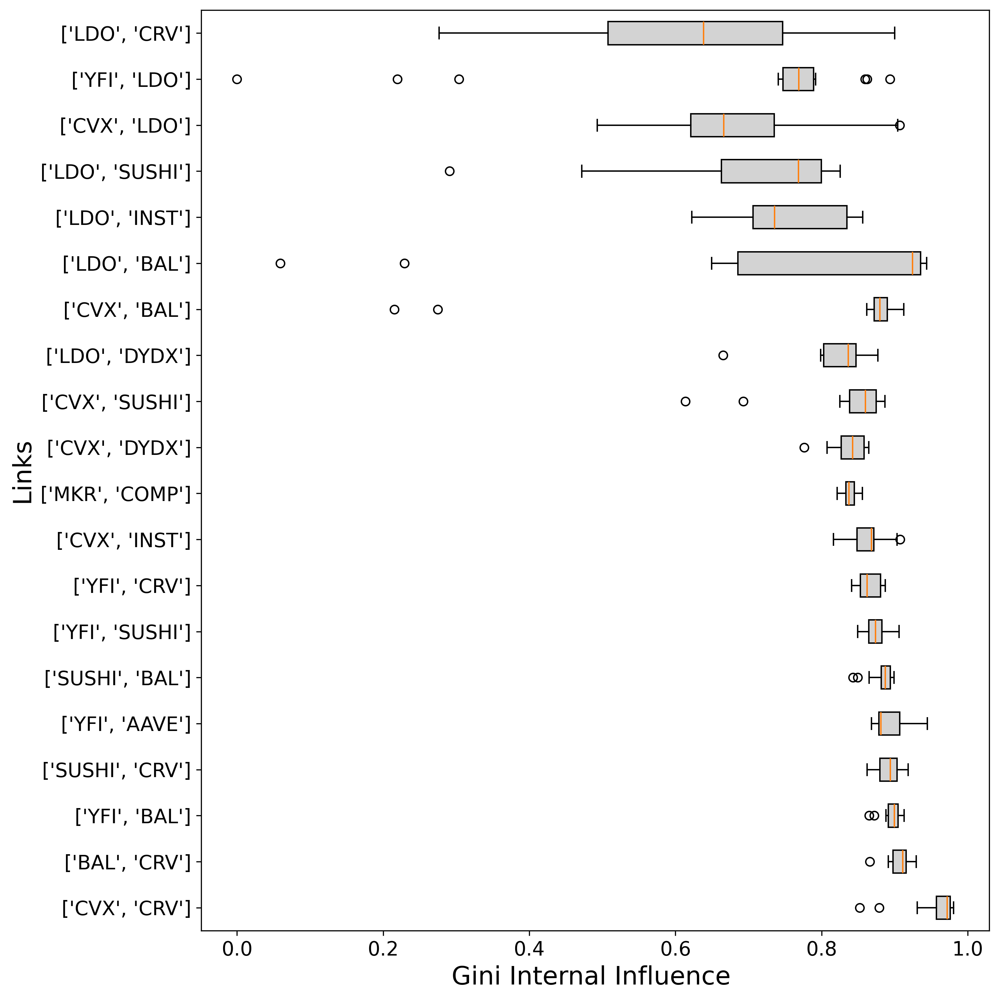

In [13]:
plot_boxplot(metric_dataframes, metric='gini_internal_influence', unit='', group='sample', pval_group='pvalues', output_path="../output/links/", custom_index='', min_occurrences=9, significance=False, save=True, show=True)

### Fig: internal_influence 

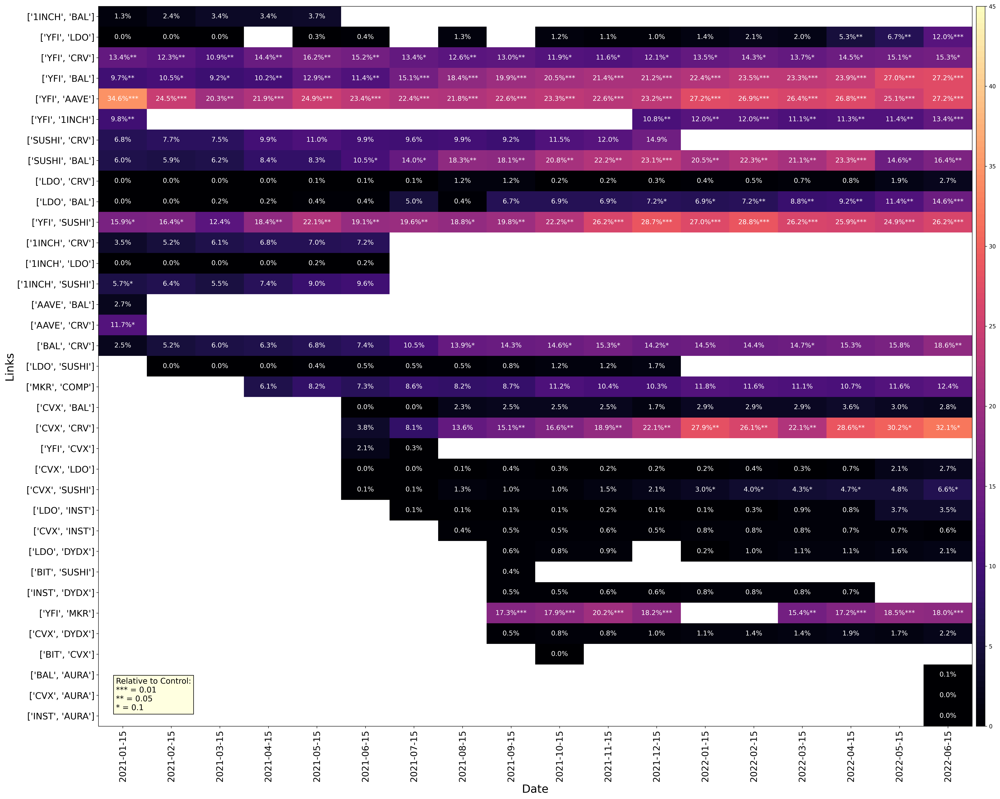

In [39]:
plot_heatmap_chart(metric_dataframes, metric_name='internal_influence', pct=True,  log=False, output_path="../output/links/", save=True, show=True)

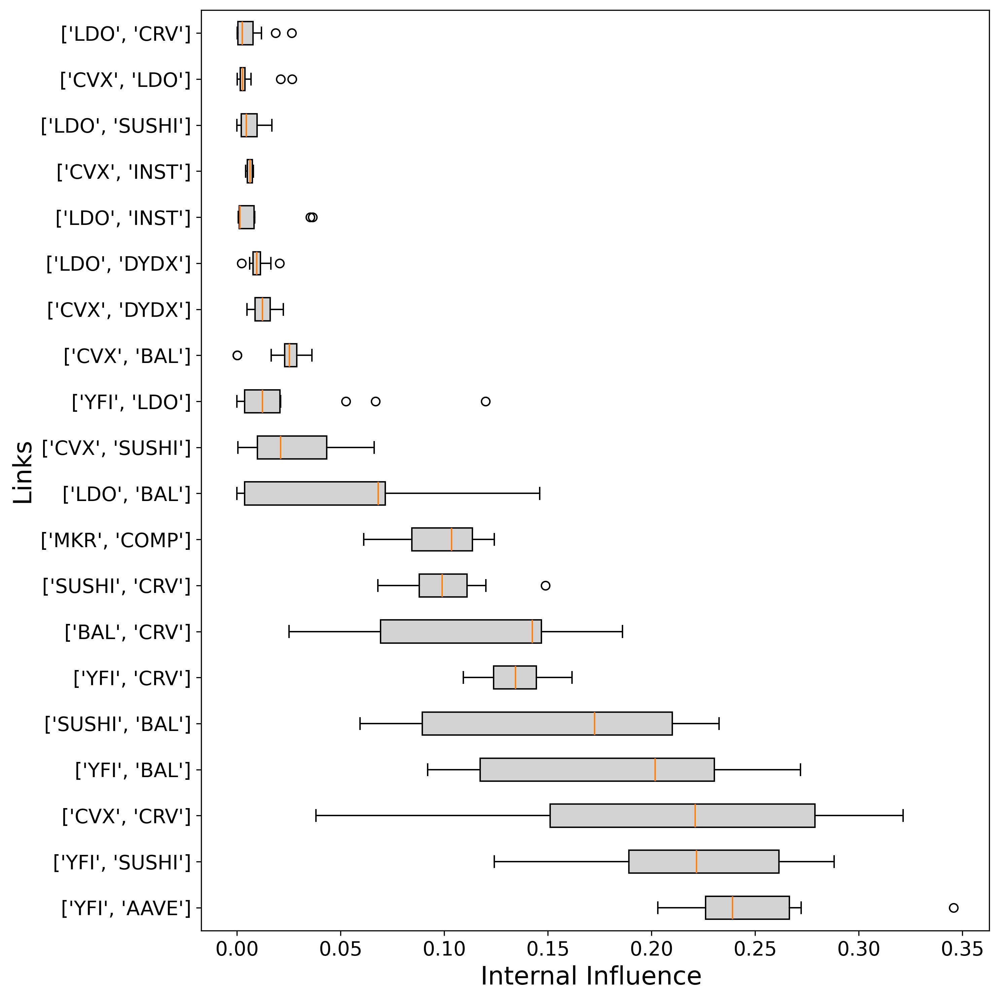

In [14]:
plot_boxplot(metric_dataframes, metric='internal_influence', unit='',group='sample', output_path="../output/links/", min_occurrences=9, save=True, show=True)

### Fig: gini_internal_influence 

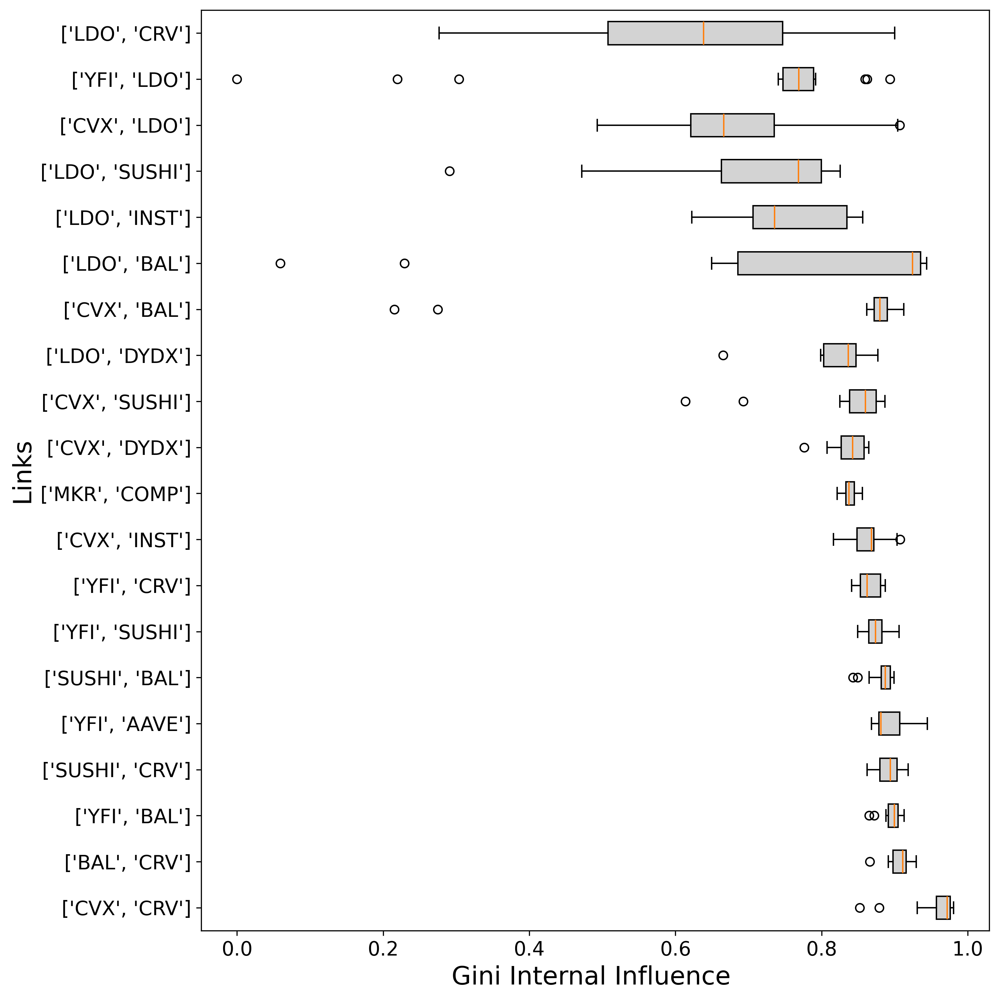

In [15]:
plot_boxplot(metric_dataframes, metric='gini_internal_influence', unit='', group='sample', output_path="../output/links/", min_occurrences=9, save=True, show=True)

### Fig: external_influence

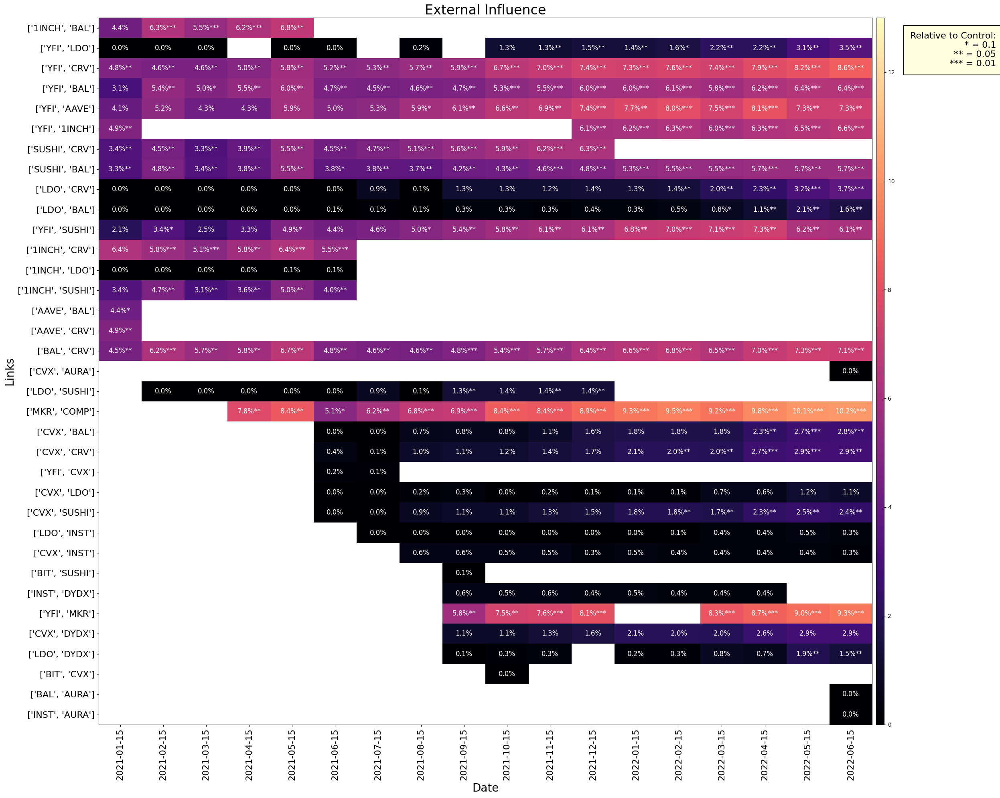

In [14]:
plot_heatmap_chart(metric_dataframes, metric_name='external_influence', pct=True, log=False, output_path="../output/links/", save=True, show=True)

### Fig: gini_external_influence

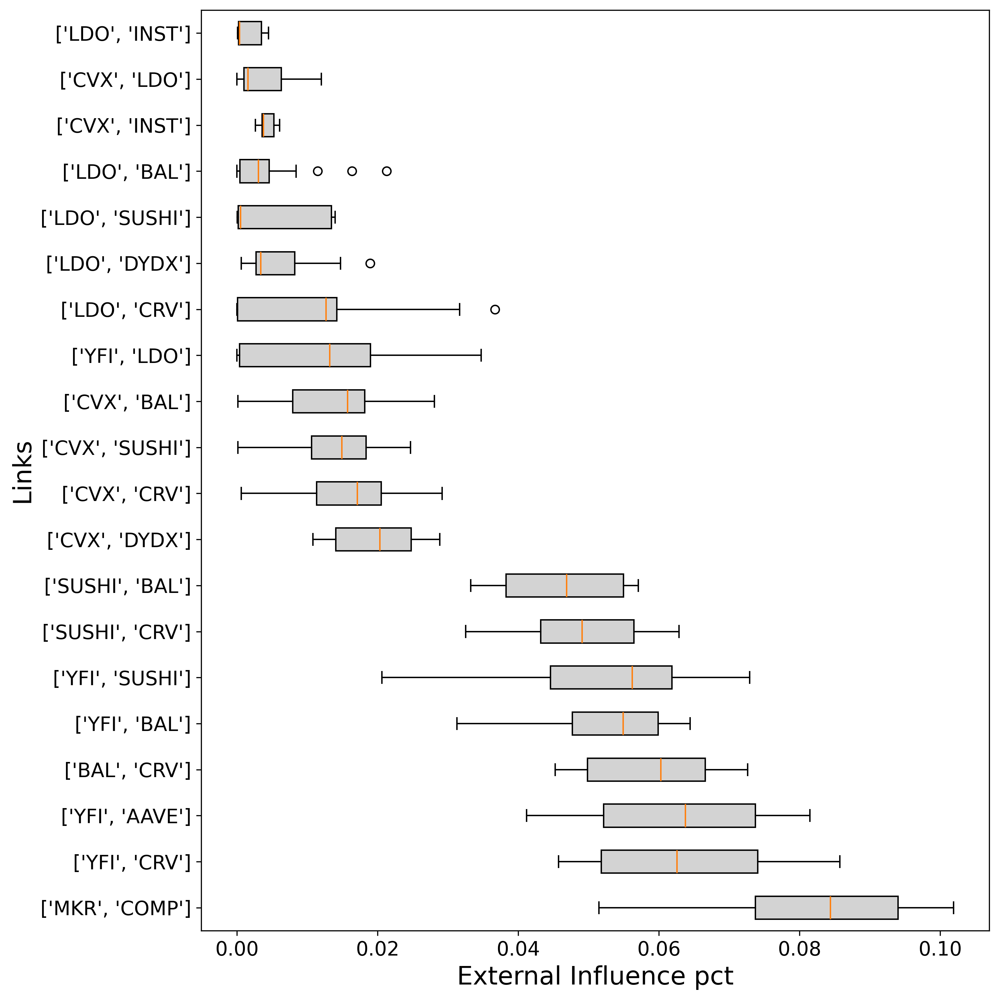

In [23]:
plot_boxplot(metric_dataframes, metric='external_influence', unit='', group='sample', output_path="../output/links/", save=True, show=True)

### Fig: wealth_clique


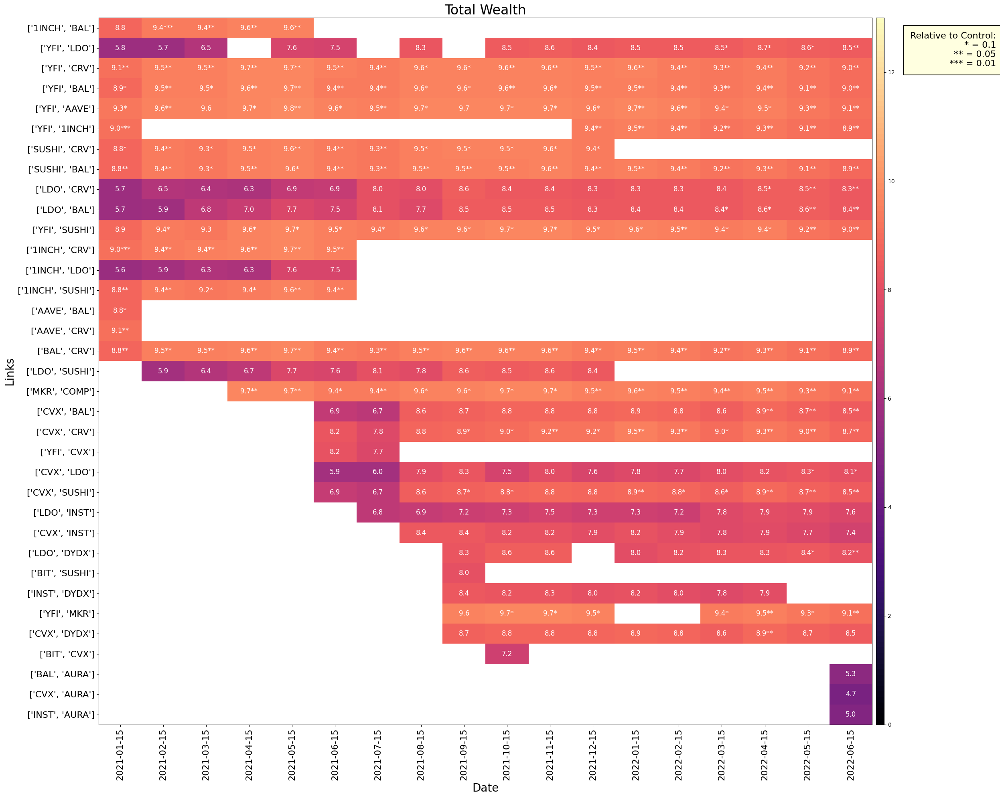

In [16]:
plot_heatmap_chart(metric_dataframes, metric_name='total_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

### Fig: gini_wealth_clique

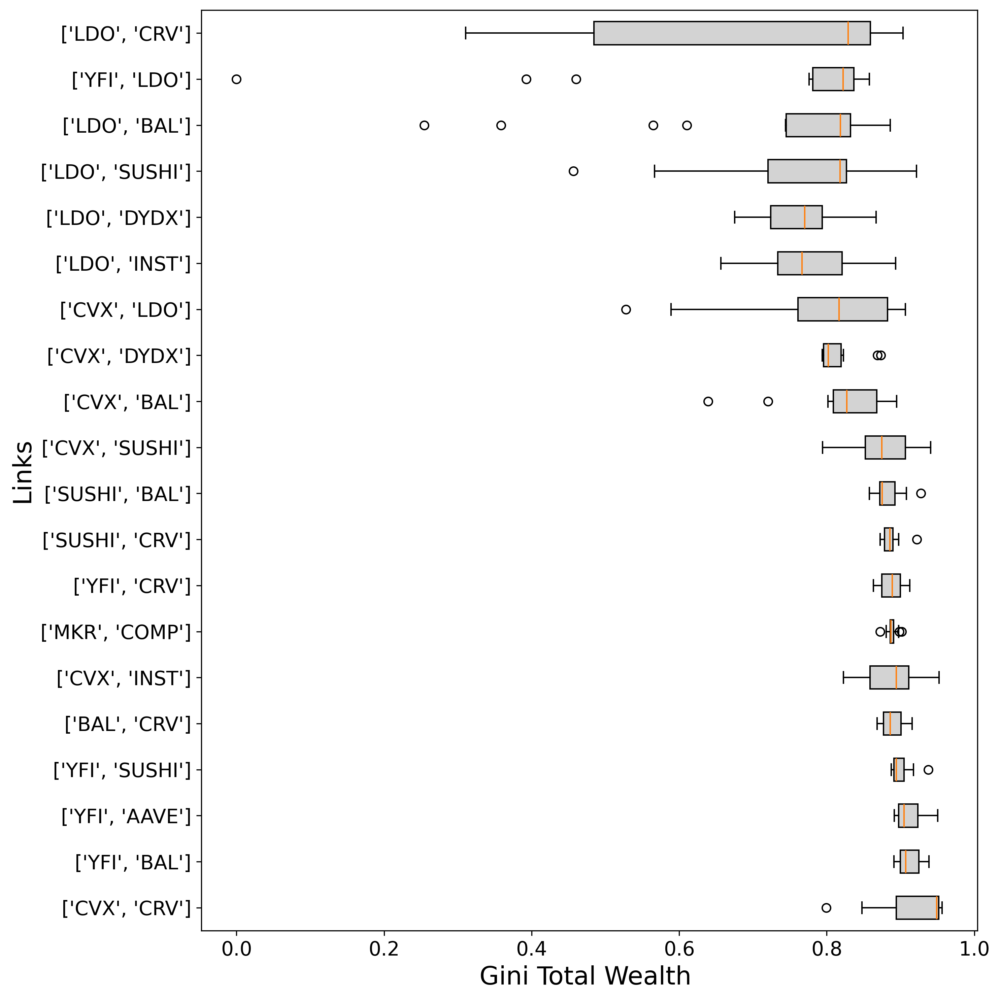

In [17]:

plot_boxplot(metric_dataframes, metric='gini_total_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


### Fig: median_wealth_level

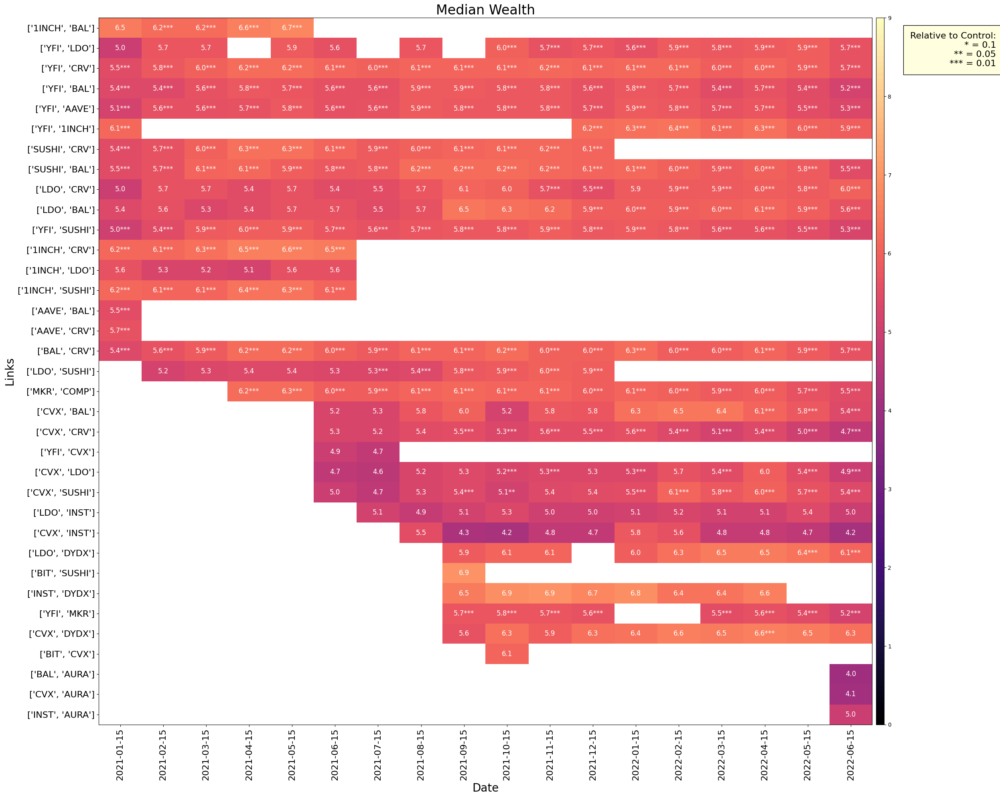

In [18]:
plot_heatmap_chart(metric_dataframes, metric_name='median_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

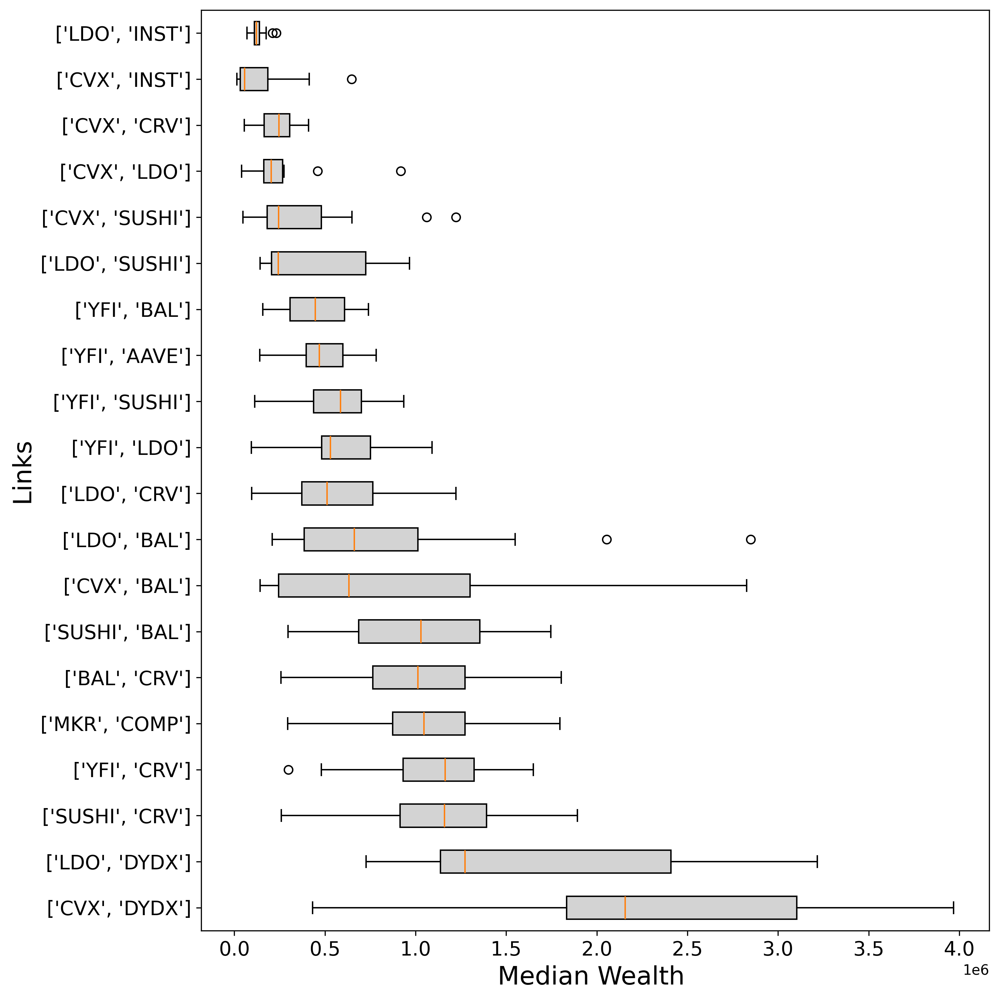

In [18]:
plot_boxplot(metric_dataframes, metric='median_wealth', unit='', group='sample', output_path="../output/links/", min_occurrences=9, save=True, show=True)


### Fig: internal_wealth

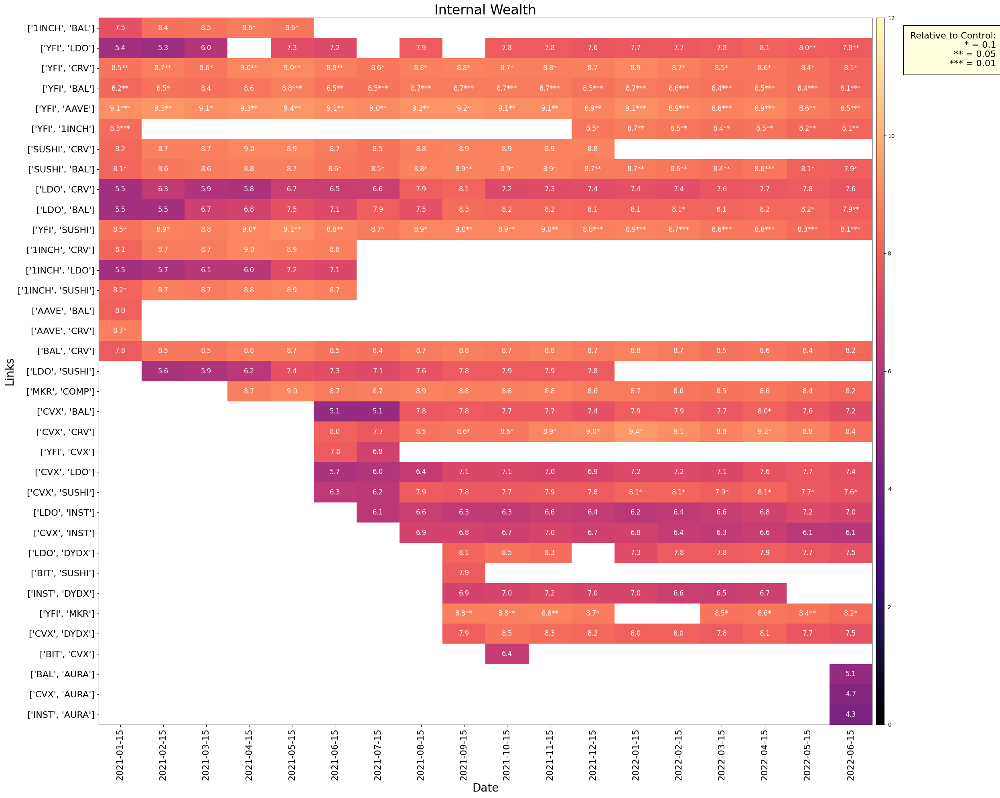

In [20]:
plot_heatmap_chart(metric_dataframes, metric_name='internal_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

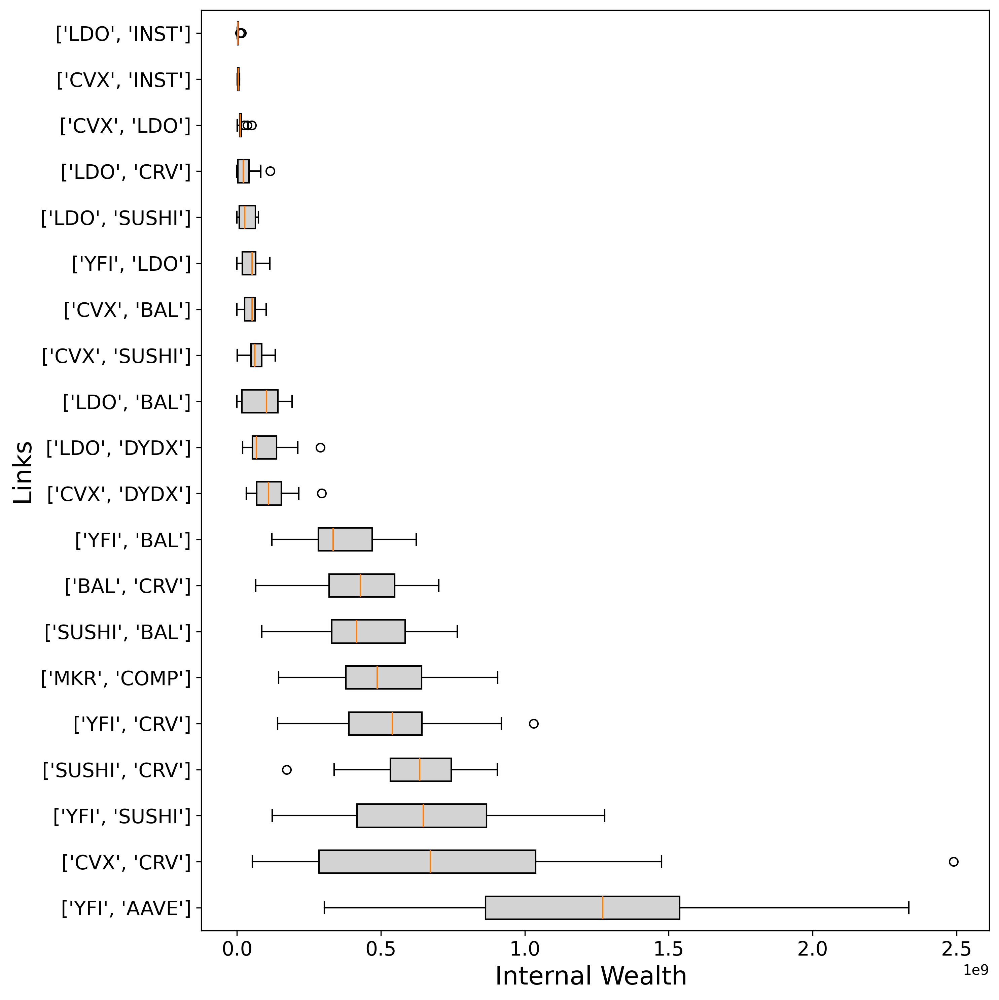

In [19]:

plot_boxplot(metric_dataframes, metric='internal_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


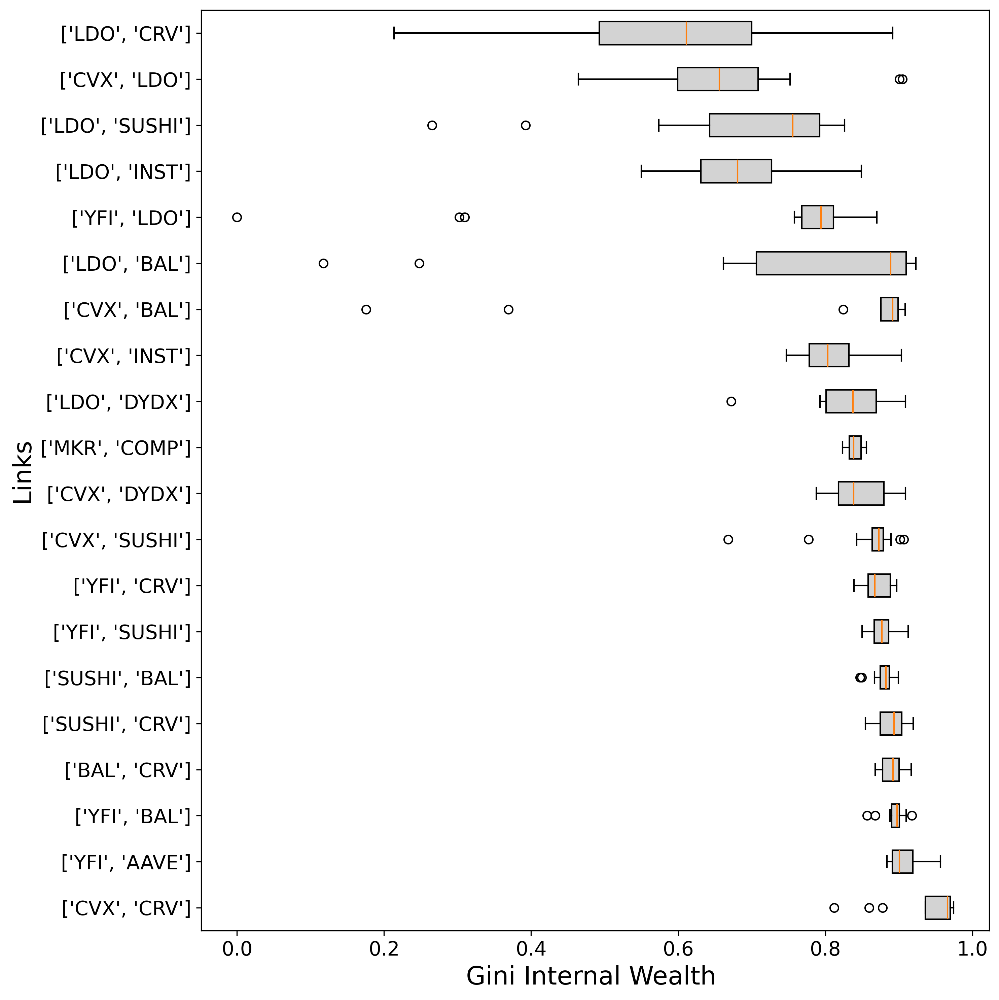

In [20]:
plot_boxplot(metric_dataframes, metric='gini_internal_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


### Fig: external_wealth

/home/xm3van/research-project-erc20-governance/.venv/lib/python3.11/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)


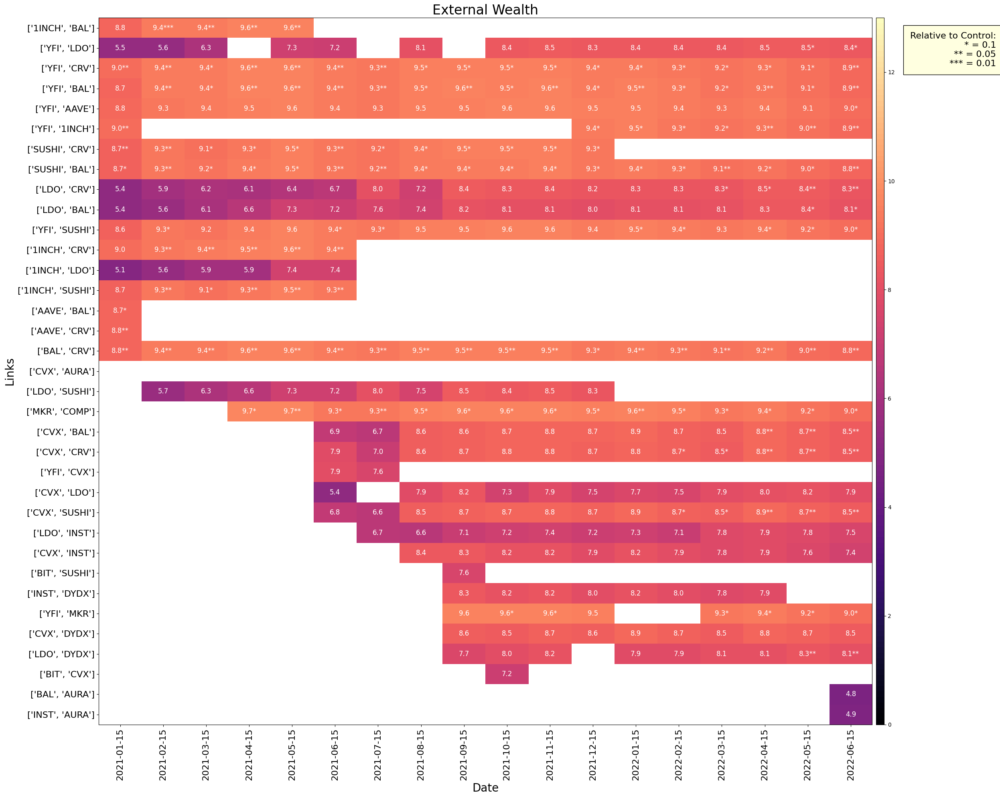

In [23]:
plot_heatmap_chart(metric_dataframes, metric_name='external_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

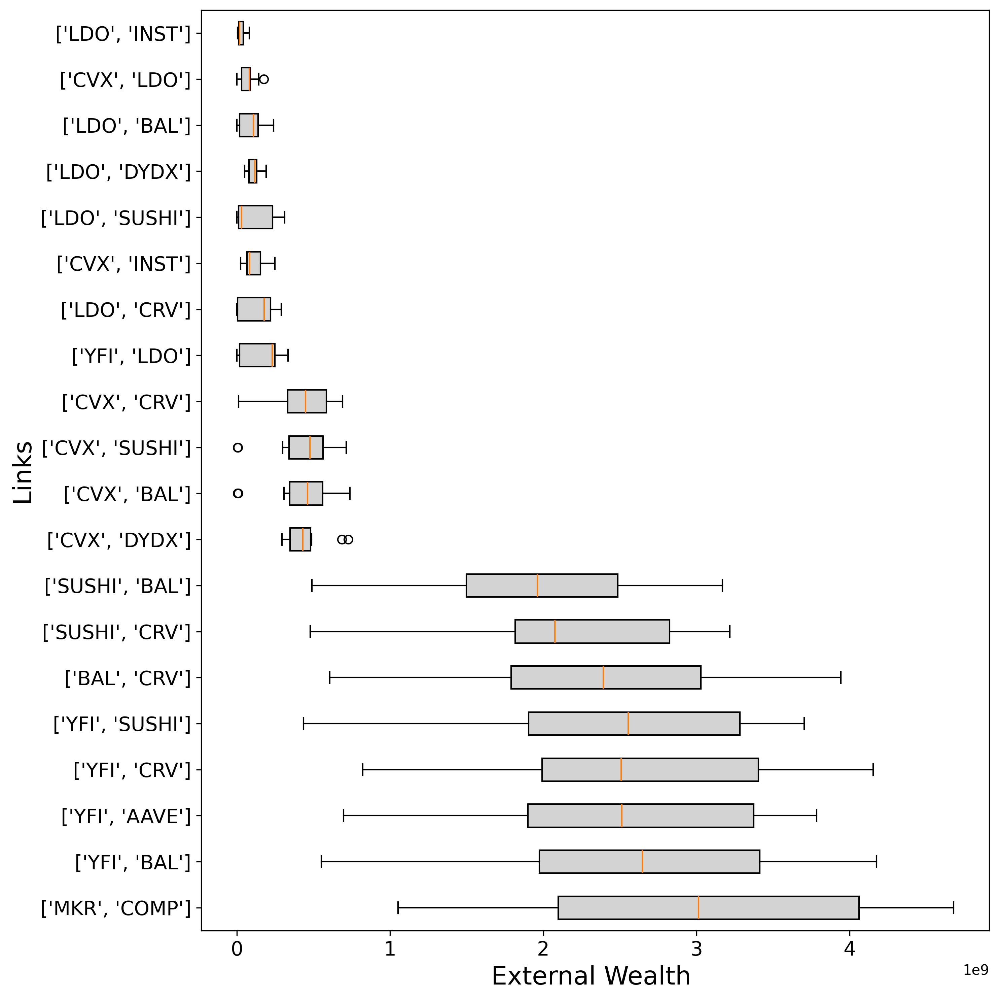

In [21]:
plot_boxplot(metric_dataframes, metric='external_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


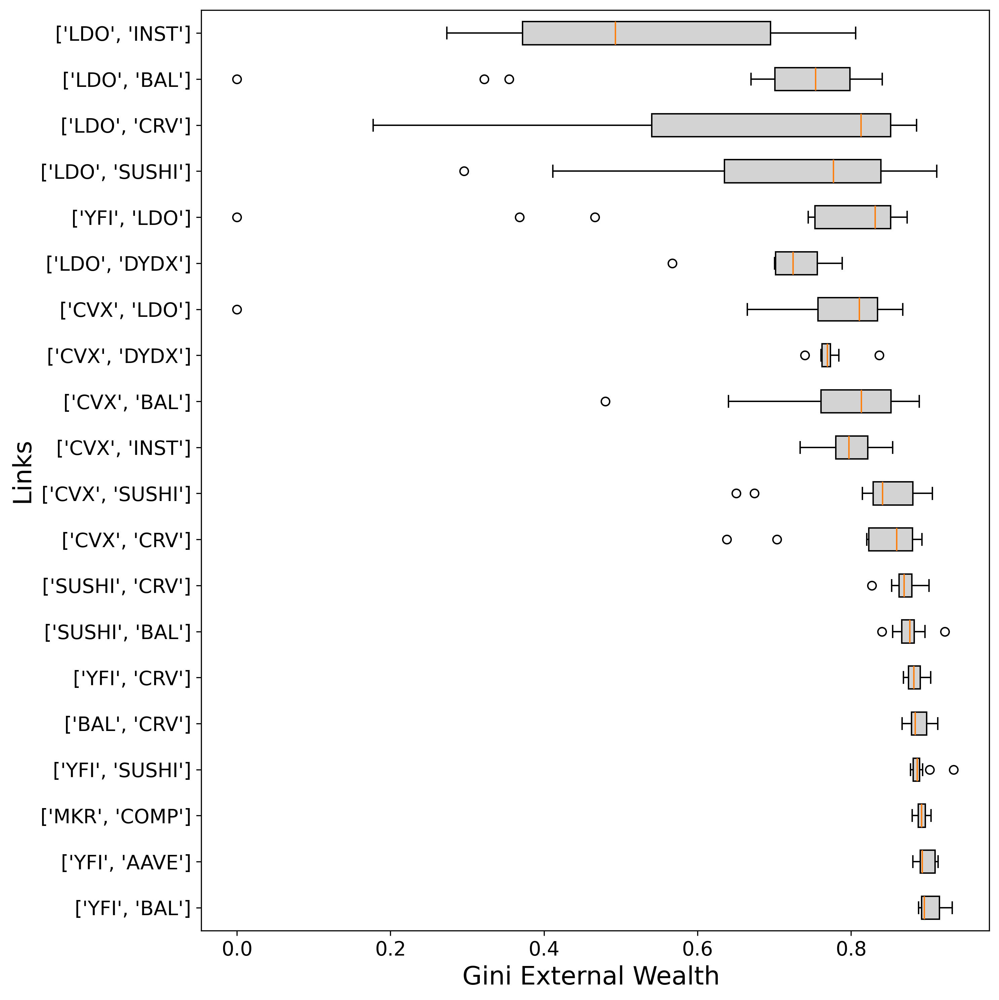

In [22]:
plot_boxplot(metric_dataframes, metric='gini_external_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


### Fig: median_no_assets_link


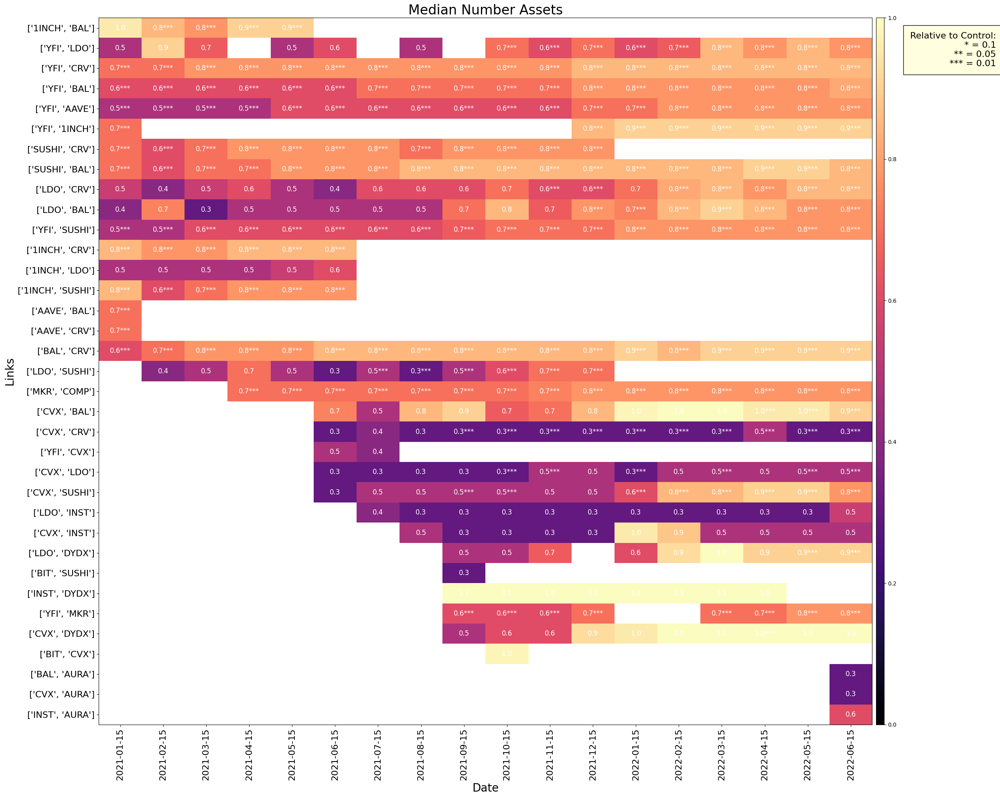

In [26]:
plot_heatmap_chart(metric_dataframes, metric_name='median_number_assets', pct=False, log=True, output_path="../output/links/", save=True, show=True)


# ISSUE: WHY DO WE HAVE LESS THAN 1 as MEDIAN

### Fig: Distribution of Labels

In [15]:
metric_dataframes['sample'].keys()

dict_keys(['size', 'median_number_assets', 'max_influence_label_distribution', 'total_influence', 'gini_total_influence', 'median_influence', 'internal_influence', 'gini_internal_influence', 'external_influence', 'gini_external_influence', 'total_influence_directional', 'total_wealth', 'gini_total_wealth', 'median_wealth', 'internal_wealth', 'gini_internal_wealth', 'external_wealth', 'gini_external_wealth'])

/tmp/ipykernel_7679/4123758345.py:90: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'{int(val)}%' for val in tick_vals])


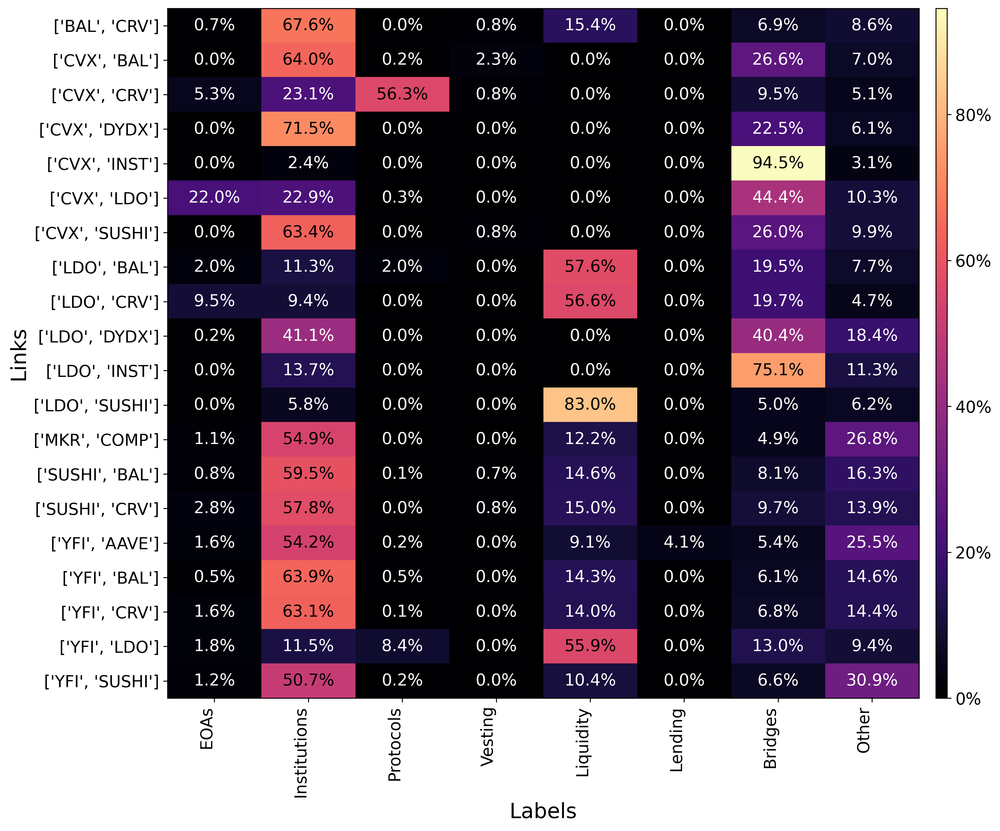

In [61]:
plot_heatmap_labels(metric_dataframes, metric='internal_max_influence_label_distribution', group='sample', colormap='magma', output_path='../output/links', min_occurrences=9)

### Sensitivity Analysis 

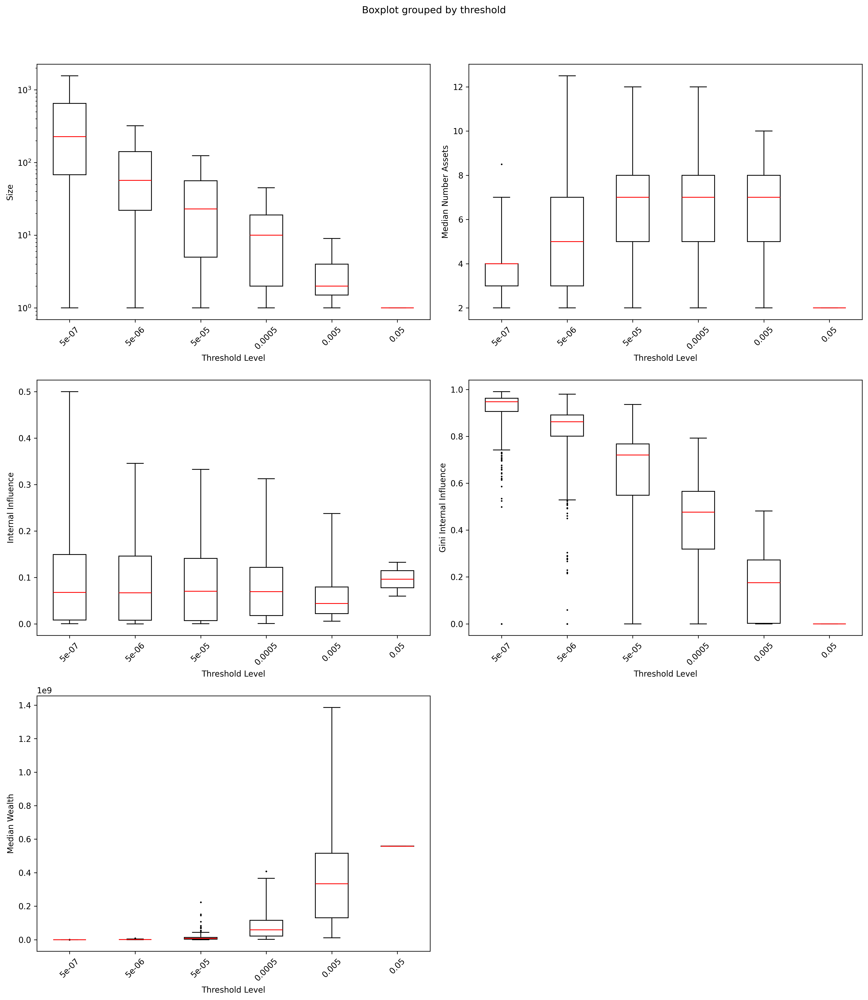

In [62]:
# Example usage
file_paths = [
    "../output/links/metrics/links_data_0.005.pkl",
    "../output/links/metrics/links_data_0.05.pkl",
    "../output/links/metrics/links_data_5e-05.pkl",
    "../output/links/metrics/links_data_5e-06.pkl",
    "../output/links/metrics/links_data_5e-07.pkl",
    "../output/links/metrics/links_data_0.0005.pkl"
]

# List of metrics to plot
chosen_metrics = ['size', 
           'median_number_assets', 
        #    'total_influence', 
        #    'gini_total_influence', 
           'internal_influence', 
           'gini_internal_influence', 
        #    'external_influence', 
        #    'gini_external_influence',  
        #    'median_influence', 
           'median_wealth', 
        #    'total_wealth', 
        #    'gini_total_wealth', 
        #    'internal_wealth', 
        #    'gini_internal_wealth', 
        #    'external_wealth', 
        #    'gini_external_wealth'
           ]

sensitivity_analysis(file_paths, chosen_metrics,output_path='../output/links')
